# Preface

In this notebook I tried to follow the ML project structure from experienced kagglers step by step, and learn how they analyze the question, explore data, preprocess data, build machine learning models, evaluate results, and submit prediction. The ultimate goal is to have a pipeline for myself to prepare for future competitions.

This notebook is mainly based on the following two authorswith some of my own modification and learning notes. Thanks to [@VAD13IRT](http://www.kaggle.com/vad13irt) and [@Sanskar Hasija](https://www.kaggle.com/odins0n) for developing such high quality notebooks.
* https://www.kaggle.com/odins0n/tps-feb-22-eda-modelling
* https://www.kaggle.com/vad13irt/tps-2022-january-exploratory-data-analysis 


# Introduction

For the February 2022 Tabular Playground Series competition, your task is to classify 10 different bacteria species using data from a genomic analysis technique that has some data compression and data loss. In this technique, 10-mer snippets of DNA are sampled and analyzed to give the histogram of base count. In other words, the DNA segment  becomes . Can you use this lossy information to accurately predict bacteria species?

# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from scipy.stats import mode

from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.ensemble import VotingClassifier

import warnings
import time
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('float_format', '{:f}'.format)
warnings.filterwarnings('ignore')

RANDOM_STATE = 14
FOLDS = 5

# Data Loading and Preperation

In [2]:
train = pd.read_csv('/kaggle/input/tabular-playground-series-feb-2022/train.csv')
test = pd.read_csv('/kaggle/input/tabular-playground-series-feb-2022/test.csv')
submission = pd.read_csv('/kaggle/input/tabular-playground-series-feb-2022/test.csv')

## Exploring Train Data

<div class = "alert alert-info" role = "alert"; style="font-size:14px; font-family:verdana;">

📌 <b><u>Observations in Train Data</u></b><br>

* There are <b><u>288</u></b> columns: <b><u>286</u></b> continous, <b><u>1</u></b> row_id, and <b><u>1</u></b> target column<br>
* There are total of <b><u>200,000</u></b> rows in train dataset<br>
* <b><u>"target"</u></b> is the target variable with <b><u>10</u></b> possible values<br>
* There are no missing / null values in this dataset
    
</div>

### Quick view of Train Data

In [3]:
train.head()

,row_id,A0T0G0C10,A0T0G1C9,A0T0G2C8,A0T0G3C7,A0T0G4C6,A0T0G5C5,A0T0G6C4,A0T0G7C3,A0T0G8C2,A0T0G9C1,A0T0G10C0,A0T1G0C9,A0T1G1C8,A0T1G2C7,A0T1G3C6,A0T1G4C5,A0T1G5C4,A0T1G6C3,A0T1G7C2,A0T1G8C1,A0T1G9C0,A0T2G0C8,A0T2G1C7,A0T2G2C6,A0T2G3C5,A0T2G4C4,A0T2G5C3,A0T2G6C2,A0T2G7C1,A0T2G8C0,A0T3G0C7,A0T3G1C6,A0T3G2C5,A0T3G3C4,A0T3G4C3,A0T3G5C2,A0T3G6C1,A0T3G7C0,A0T4G0C6,A0T4G1C5,A0T4G2C4,A0T4G3C3,A0T4G4C2,A0T4G5C1,A0T4G6C0,A0T5G0C5,A0T5G1C4,A0T5G2C3,A0T5G3C2,A0T5G4C1,A0T5G5C0,A0T6G0C4,A0T6G1C3,A0T6G2C2,A0T6G3C1,A0T6G4C0,A0T7G0C3,A0T7G1C2,A0T7G2C1,A0T7G3C0,A0T8G0C2,A0T8G1C1,A0T8G2C0,A0T9G0C1,A0T9G1C0,A0T10G0C0,A1T0G0C9,A1T0G1C8,A1T0G2C7,A1T0G3C6,A1T0G4C5,A1T0G5C4,A1T0G6C3,A1T0G7C2,A1T0G8C1,A1T0G9C0,A1T1G0C8,A1T1G1C7,A1T1G2C6,A1T1G3C5,A1T1G4C4,A1T1G5C3,A1T1G6C2,A1T1G7C1,A1T1G8C0,A1T2G0C7,A1T2G1C6,A1T2G2C5,A1T2G3C4,A1T2G4C3,A1T2G5C2,A1T2G6C1,A1T2G7C0,A1T3G0C6,A1T3G1C5,A1T3G2C4,A1T3G3C3,A1T3G4C2,A1T3G5C1,A1T3G6C0,A1T4G0C5,A1T4G1C4,A1T4G2C3,A1T4G3C2,A1T4G4C1,A1T4G5C0,A1T5G0C4,A1T5G1C3,A1T5G2C2,A1T5G3C1,A1T5G4C0,A1T6G0C3,A1T6G1C2,A1T6G2C1,A1T6G3C0,A1T7G0C2,A1T7G1C1,A1T7G2C0,A1T8G0C1,A1T8G1C0,A1T9G0C0,A2T0G0C8,A2T0G1C7,A2T0G2C6,A2T0G3C5,A2T0G4C4,A2T0G5C3,A2T0G6C2,A2T0G7C1,A2T0G8C0,A2T1G0C7,A2T1G1C6,A2T1G2C5,A2T1G3C4,A2T1G4C3,A2T1G5C2,A2T1G6C1,A2T1G7C0,A2T2G0C6,A2T2G1C5,A2T2G2C4,A2T2G3C3,A2T2G4C2,A2T2G5C1,A2T2G6C0,A2T3G0C5,A2T3G1C4,A2T3G2C3,A2T3G3C2,A2T3G4C1,A2T3G5C0,A2T4G0C4,A2T4G1C3,A2T4G2C2,A2T4G3C1,A2T4G4C0,A2T5G0C3,A2T5G1C2,A2T5G2C1,A2T5G3C0,A2T6G0C2,A2T6G1C1,A2T6G2C0,A2T7G0C1,A2T7G1C0,A2T8G0C0,A3T0G0C7,A3T0G1C6,A3T0G2C5,A3T0G3C4,A3T0G4C3,A3T0G5C2,A3T0G6C1,A3T0G7C0,A3T1G0C6,A3T1G1C5,A3T1G2C4,A3T1G3C3,A3T1G4C2,A3T1G5C1,A3T1G6C0,A3T2G0C5,A3T2G1C4,A3T2G2C3,A3T2G3C2,A3T2G4C1,A3T2G5C0,A3T3G0C4,A3T3G1C3,A3T3G2C2,A3T3G3C1,A3T3G4C0,A3T4G0C3,A3T4G1C2,A3T4G2C1,A3T4G3C0,A3T5G0C2,A3T5G1C1,A3T5G2C0,A3T6G0C1,A3T6G1C0,A3T7G0C0,A4T0G0C6,A4T0G1C5,A4T0G2C4,A4T0G3C3,A4T0G4C2,A4T0G5C1,A4T0G6C0,A4T1G0C5,A4T1G1C4,A4T1G2C3,A4T1G3C2,A4T1G4C1,A4T1G5C0,A4T2G0C4,A4T2G1C3,A4T2G2C2,A4T2G3C1,A4T2G4C0,A4T3G0C3,A4T3G1C2,A4T3G2C1,A4T3G3C0,A4T4G0C2,A4T4G1C1,A4T4G2C0,A4T5G0C1,A4T5G1C0,A4T6G0C0,A5T0G0C5,A5T0G1C4,A5T0G2C3,A5T0G3C2,A5T0G4C1,A5T0G5C0,A5T1G0C4,A5T1G1C3,A5T1G2C2,A5T1G3C1,A5T1G4C0,A5T2G0C3,A5T2G1C2,A5T2G2C1,A5T2G3C0,A5T3G0C2,A5T3G1C1,A5T3G2C0,A5T4G0C1,A5T4G1C0,A5T5G0C0,A6T0G0C4,A6T0G1C3,A6T0G2C2,A6T0G3C1,A6T0G4C0,A6T1G0C3,A6T1G1C2,A6T1G2C1,A6T1G3C0,A6T2G0C2,A6T2G1C1,A6T2G2C0,A6T3G0C1,A6T3G1C0,A6T4G0C0,A7T0G0C3,A7T0G1C2,A7T0G2C1,A7T0G3C0,A7T1G0C2,A7T1G1C1,A7T1G2C0,A7T2G0C1,A7T2G1C0,A7T3G0C0,A8T0G0C2,A8T0G1C1,A8T0G2C0,A8T1G0C1,A8T1G1C0,A8T2G0C0,A9T0G0C1,A9T0G1C0,A9T1G0C0,A10T0G0C0,target
0,0,-0.000001,-0.000010,-0.000043,-0.000114,-0.000200,-0.000240,-0.000200,-0.000114,-0.000043,-0.000010,-0.000001,-0.000010,-0.000086,-0.000343,-0.000801,-0.001202,-0.001202,-0.000801,-0.000343,-0.000086,-0.000010,-0.000043,-0.000343,-0.001202,-0.002403,-0.003004,-0.002403,-0.001202,-0.000343,-0.000043,-0.000114,-0.000801,-0.002403,-0.004005,-0.004005,-0.002403,-0.000801,-0.000114,-0.000200,-0.001202,-0.003004,-0.004005,-0.003004,-0.001202,-0.000200,-0.000240,-0.001202,-0.002403,-0.002403,-0.001202,-0.000240,-0.000200,-0.000801,-0.001202,-0.000801,-0.000200,-0.000114,-0.000343,-0.000343,-0.000114,-0.000043,-0.000086,-0.000043,-0.000010,-0.000010,-0.000001,-0.000010,-0.000086,-0.000343,-0.000801,-0.001202,-0.001202,-0.000801,-0.000343,-0.000086,-0.000010,-0.000086,-0.000687,-0.002403,-0.004807,-0.006008,-0.004807,-0.002403,-0.000687,-0.000086,-0.000343,-0.002403,-0.007210,-0.002016,-0.012016,-0.007210,0.017597,0.009657,-0.000801,-0.004807,0.007984,-0.006022,0.007984,-0.004807,-0.000801,-0.001202,0.003992,-0.012016,-0.012016,0.003992,0.008798,-0.001202,-0.004807,0.002790,-0.004807,-0.001202,-0.000801,0.007597,0.007597,-0.000801,-0.000343,-0.000687,-0.000343,-0.000086,-0.000086,-0.000010,-0.000043,-0.000343,-0.001202,-0.002403,-0.003004,-0.002403,-0.001202,-0.000343,-0.000043,-0.000343,-0.002403,-0.007210,-0.012016,-0.002016,-0.007210,-0.002403,-0.000343,0.008798,-0.007210,0.011976,-0.01

In [4]:
print(f'\033[92mNumber of rows in train data: {train.shape[0]}')
print(f'\033[94mNumber of columns in train data: {train.shape[1]}')
print(f'\033[91mNumber of observations in train data: {train.count().sum()}')
print(f'\033[91mNumber of missing values in train data: {sum(train.isnull().sum())}')

Number of rows in train data: 200000
Number of columns in train data: 288
Number of observations in train data: 57600000
Number of missing values in train data: 0


### Basic statistics of training data
Below is the basic statistics for each variables in the training dataset, which contain information on `count`, `mean`, `standard deviation`, `minimum`, `1st quartile`, `median`, `3rd quartile`, and `maximum`.

In [5]:
train.describe()

,row_id,A0T0G0C10,A0T0G1C9,A0T0G2C8,A0T0G3C7,A0T0G4C6,A0T0G5C5,A0T0G6C4,A0T0G7C3,A0T0G8C2,A0T0G9C1,A0T0G10C0,A0T1G0C9,A0T1G1C8,A0T1G2C7,A0T1G3C6,A0T1G4C5,A0T1G5C4,A0T1G6C3,A0T1G7C2,A0T1G8C1,A0T1G9C0,A0T2G0C8,A0T2G1C7,A0T2G2C6,A0T2G3C5,A0T2G4C4,A0T2G5C3,A0T2G6C2,A0T2G7C1,A0T2G8C0,A0T3G0C7,A0T3G1C6,A0T3G2C5,A0T3G3C4,A0T3G4C3,A0T3G5C2,A0T3G6C1,A0T3G7C0,A0T4G0C6,A0T4G1C5,A0T4G2C4,A0T4G3C3,A0T4G4C2,A0T4G5C1,A0T4G6C0,A0T5G0C5,A0T5G1C4,A0T5G2C3,A0T5G3C2,A0T5G4C1,A0T5G5C0,A0T6G0C4,A0T6G1C3,A0T6G2C2,A0T6G3C1,A0T6G4C0,A0T7G0C3,A0T7G1C2,A0T7G2C1,A0T7G3C0,A0T8G0C2,A0T8G1C1,A0T8G2C0,A0T9G0C1,A0T9G1C0,A0T10G0C0,A1T0G0C9,A1T0G1C8,A1T0G2C7,A1T0G3C6,A1T0G4C5,A1T0G5C4,A1T0G6C3,A1T0G7C2,A1T0G8C1,A1T0G9C0,A1T1G0C8,A1T1G1C7,A1T1G2C6,A1T1G3C5,A1T1G4C4,A1T1G5C3,A1T1G6C2,A1T1G7C1,A1T1G8C0,A1T2G0C7,A1T2G1C6,A1T2G2C5,A1T2G3C4,A1T2G4C3,A1T2G5C2,A1T2G6C1,A1T2G7C0,A1T3G0C6,A1T3G1C5,A1T3G2C4,A1T3G3C3,A1T3G4C2,A1T3G5C1,A1T3G6C0,A1T4G0C5,A1T4G1C4,A1T4G2C3,A1T4G3C2,A1T4G4C1,A1T4G5C0,A1T5G0C4,A1T5G1C3,A1T5G2C2,A1T5G3C1,A1T5G4C0,A1T6G0C3,A1T6G1C2,A1T6G2C1,A1T6G3C0,A1T7G0C2,A1T7G1C1,A1T7G2C0,A1T8G0C1,A1T8G1C0,A1T9G0C0,A2T0G0C8,A2T0G1C7,A2T0G2C6,A2T0G3C5,A2T0G4C4,A2T0G5C3,A2T0G6C2,A2T0G7C1,A2T0G8C0,A2T1G0C7,A2T1G1C6,A2T1G2C5,A2T1G3C4,A2T1G4C3,A2T1G5C2,A2T1G6C1,A2T1G7C0,A2T2G0C6,A2T2G1C5,A2T2G2C4,A2T2G3C3,A2T2G4C2,A2T2G5C1,A2T2G6C0,A2T3G0C5,A2T3G1C4,A2T3G2C3,A2T3G3C2,A2T3G4C1,A2T3G5C0,A2T4G0C4,A2T4G1C3,A2T4G2C2,A2T4G3C1,A2T4G4C0,A2T5G0C3,A2T5G1C2,A2T5G2C1,A2T5G3C0,A2T6G0C2,A2T6G1C1,A2T6G2C0,A2T7G0C1,A2T7G1C0,A2T8G0C0,A3T0G0C7,A3T0G1C6,A3T0G2C5,A3T0G3C4,A3T0G4C3,A3T0G5C2,A3T0G6C1,A3T0G7C0,A3T1G0C6,A3T1G1C5,A3T1G2C4,A3T1G3C3,A3T1G4C2,A3T1G5C1,A3T1G6C0,A3T2G0C5,A3T2G1C4,A3T2G2C3,A3T2G3C2,A3T2G4C1,A3T2G5C0,A3T3G0C4,A3T3G1C3,A3T3G2C2,A3T3G3C1,A3T3G4C0,A3T4G0C3,A3T4G1C2,A3T4G2C1,A3T4G3C0,A3T5G0C2,A3T5G1C1,A3T5G2C0,A3T6G0C1,A3T6G1C0,A3T7G0C0,A4T0G0C6,A4T0G1C5,A4T0G2C4,A4T0G3C3,A4T0G4C2,A4T0G5C1,A4T0G6C0,A4T1G0C5,A4T1G1C4,A4T1G2C3,A4T1G3C2,A4T1G4C1,A4T1G5C0,A4T2G0C4,A4T2G1C3,A4T2G2C2,A4T2G3C1,A4T2G4C0,A4T3G0C3,A4T3G1C2,A4T3G2C1,A4T3G3C0,A4T4G0C2,A4T4G1C1,A4T4G2C0,A4T5G0C1,A4T5G1C0,A4T6G0C0,A5T0G0C5,A5T0G1C4,A5T0G2C3,A5T0G3C2,A5T0G4C1,A5T0G5C0,A5T1G0C4,A5T1G1C3,A5T1G2C2,A5T1G3C1,A5T1G4C0,A5T2G0C3,A5T2G1C2,A5T2G2C1,A5T2G3C0,A5T3G0C2,A5T3G1C1,A5T3G2C0,A5T4G0C1,A5T4G1C0,A5T5G0C0,A6T0G0C4,A6T0G1C3,A6T0G2C2,A6T0G3C1,A6T0G4C0,A6T1G0C3,A6T1G1C2,A6T1G2C1,A6T1G3C0,A6T2G0C2,A6T2G1C1,A6T2G2C0,A6T3G0C1,A6T3G1C0,A6T4G0C0,A7T0G0C3,A7T0G1C2,A7T0G2C1,A7T0G3C0,A7T1G0C2,A7T1G1C1,A7T1G2C0,A7T2G0C1,A7T2G1C0,A7T3G0C0,A8T0G0C2,A8T0G1C1,A8T0G2C0,A8T1G0C1,A8T1G1C0,A8T2G0C0,A9T0G0C1,A9T0G1C0,A9T1G0C0,A10T0G0C0
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.0

## Exploring Test Data

<div class = "alert alert-info" role = "alert" style="font-size:14px; font-family:verdana;">
    
📌 <b><u>Observations in Test Data</u></b><br>

* There are <b><u>287</u></b> columns: <b><u>286</u></b> continous, and <b><u>1</u></b> row_id<br>
* There are total of <b><u>100,000</u></b> rows in train dataset<br>
* There are no missing / null values in this dataset
    
</div>

In [6]:
print(f'\033[92mNumber of rows in train data: {test.shape[0]}')
print(f'\033[94mNumber of columns in train data: {test.shape[1]}')
print(f'\033[91mNumber of observations in train data: {test.count().sum()}')
print(f'\033[91mNumber of missing values in train data: {sum(test.isnull().sum())}')

Number of rows in train data: 100000
Number of columns in train data: 287
Number of observations in train data: 28700000
Number of missing values in train data: 0


### Quick view of Test Data

In [7]:
test.head()

,row_id,A0T0G0C10,A0T0G1C9,A0T0G2C8,A0T0G3C7,A0T0G4C6,A0T0G5C5,A0T0G6C4,A0T0G7C3,A0T0G8C2,A0T0G9C1,A0T0G10C0,A0T1G0C9,A0T1G1C8,A0T1G2C7,A0T1G3C6,A0T1G4C5,A0T1G5C4,A0T1G6C3,A0T1G7C2,A0T1G8C1,A0T1G9C0,A0T2G0C8,A0T2G1C7,A0T2G2C6,A0T2G3C5,A0T2G4C4,A0T2G5C3,A0T2G6C2,A0T2G7C1,A0T2G8C0,A0T3G0C7,A0T3G1C6,A0T3G2C5,A0T3G3C4,A0T3G4C3,A0T3G5C2,A0T3G6C1,A0T3G7C0,A0T4G0C6,A0T4G1C5,A0T4G2C4,A0T4G3C3,A0T4G4C2,A0T4G5C1,A0T4G6C0,A0T5G0C5,A0T5G1C4,A0T5G2C3,A0T5G3C2,A0T5G4C1,A0T5G5C0,A0T6G0C4,A0T6G1C3,A0T6G2C2,A0T6G3C1,A0T6G4C0,A0T7G0C3,A0T7G1C2,A0T7G2C1,A0T7G3C0,A0T8G0C2,A0T8G1C1,A0T8G2C0,A0T9G0C1,A0T9G1C0,A0T10G0C0,A1T0G0C9,A1T0G1C8,A1T0G2C7,A1T0G3C6,A1T0G4C5,A1T0G5C4,A1T0G6C3,A1T0G7C2,A1T0G8C1,A1T0G9C0,A1T1G0C8,A1T1G1C7,A1T1G2C6,A1T1G3C5,A1T1G4C4,A1T1G5C3,A1T1G6C2,A1T1G7C1,A1T1G8C0,A1T2G0C7,A1T2G1C6,A1T2G2C5,A1T2G3C4,A1T2G4C3,A1T2G5C2,A1T2G6C1,A1T2G7C0,A1T3G0C6,A1T3G1C5,A1T3G2C4,A1T3G3C3,A1T3G4C2,A1T3G5C1,A1T3G6C0,A1T4G0C5,A1T4G1C4,A1T4G2C3,A1T4G3C2,A1T4G4C1,A1T4G5C0,A1T5G0C4,A1T5G1C3,A1T5G2C2,A1T5G3C1,A1T5G4C0,A1T6G0C3,A1T6G1C2,A1T6G2C1,A1T6G3C0,A1T7G0C2,A1T7G1C1,A1T7G2C0,A1T8G0C1,A1T8G1C0,A1T9G0C0,A2T0G0C8,A2T0G1C7,A2T0G2C6,A2T0G3C5,A2T0G4C4,A2T0G5C3,A2T0G6C2,A2T0G7C1,A2T0G8C0,A2T1G0C7,A2T1G1C6,A2T1G2C5,A2T1G3C4,A2T1G4C3,A2T1G5C2,A2T1G6C1,A2T1G7C0,A2T2G0C6,A2T2G1C5,A2T2G2C4,A2T2G3C3,A2T2G4C2,A2T2G5C1,A2T2G6C0,A2T3G0C5,A2T3G1C4,A2T3G2C3,A2T3G3C2,A2T3G4C1,A2T3G5C0,A2T4G0C4,A2T4G1C3,A2T4G2C2,A2T4G3C1,A2T4G4C0,A2T5G0C3,A2T5G1C2,A2T5G2C1,A2T5G3C0,A2T6G0C2,A2T6G1C1,A2T6G2C0,A2T7G0C1,A2T7G1C0,A2T8G0C0,A3T0G0C7,A3T0G1C6,A3T0G2C5,A3T0G3C4,A3T0G4C3,A3T0G5C2,A3T0G6C1,A3T0G7C0,A3T1G0C6,A3T1G1C5,A3T1G2C4,A3T1G3C3,A3T1G4C2,A3T1G5C1,A3T1G6C0,A3T2G0C5,A3T2G1C4,A3T2G2C3,A3T2G3C2,A3T2G4C1,A3T2G5C0,A3T3G0C4,A3T3G1C3,A3T3G2C2,A3T3G3C1,A3T3G4C0,A3T4G0C3,A3T4G1C2,A3T4G2C1,A3T4G3C0,A3T5G0C2,A3T5G1C1,A3T5G2C0,A3T6G0C1,A3T6G1C0,A3T7G0C0,A4T0G0C6,A4T0G1C5,A4T0G2C4,A4T0G3C3,A4T0G4C2,A4T0G5C1,A4T0G6C0,A4T1G0C5,A4T1G1C4,A4T1G2C3,A4T1G3C2,A4T1G4C1,A4T1G5C0,A4T2G0C4,A4T2G1C3,A4T2G2C2,A4T2G3C1,A4T2G4C0,A4T3G0C3,A4T3G1C2,A4T3G2C1,A4T3G3C0,A4T4G0C2,A4T4G1C1,A4T4G2C0,A4T5G0C1,A4T5G1C0,A4T6G0C0,A5T0G0C5,A5T0G1C4,A5T0G2C3,A5T0G3C2,A5T0G4C1,A5T0G5C0,A5T1G0C4,A5T1G1C3,A5T1G2C2,A5T1G3C1,A5T1G4C0,A5T2G0C3,A5T2G1C2,A5T2G2C1,A5T2G3C0,A5T3G0C2,A5T3G1C1,A5T3G2C0,A5T4G0C1,A5T4G1C0,A5T5G0C0,A6T0G0C4,A6T0G1C3,A6T0G2C2,A6T0G3C1,A6T0G4C0,A6T1G0C3,A6T1G1C2,A6T1G2C1,A6T1G3C0,A6T2G0C2,A6T2G1C1,A6T2G2C0,A6T3G0C1,A6T3G1C0,A6T4G0C0,A7T0G0C3,A7T0G1C2,A7T0G2C1,A7T0G3C0,A7T1G0C2,A7T1G1C1,A7T1G2C0,A7T2G0C1,A7T2G1C0,A7T3G0C0,A8T0G0C2,A8T0G1C1,A8T0G2C0,A8T1G0C1,A8T1G1C0,A8T2G0C0,A9T0G0C1,A9T0G1C0,A9T1G0C0,A10T0G0C0
0,200000,-0.000001,-0.000002,-0.000001,0.000024,0.000034,-0.000002,0.000021,0.000024,-0.000009,-0.000008,-0.000001,-0.000003,-0.000017,-0.000074,0.000038,0.000068,0.000164,0.000180,-0.000003,-0.000025,-0.000009,0.000004,-0.000101,-0.000171,0.000006,0.000330,0.000580,0.000228,-0.000015,-0.000016,-0.000026,-0.000146,-0.000075,0.000212,0.000565,0.000359,0.000072,-0.000005,-0.000043,-0.000110,0.000061,0.000349,0.000338,0.000163,-0.000003,0.000005,0.000050,0.000332,0.000447,0.000212,0.000016,0.000031,0.000196,0.000331,0.000261,0.000035,0.000064,0.000202,0.000175,0.000047,0.000031,0.000104,0.000026,0.000012,0.000009,-0.000001,0.000000,-0.000016,-0.000005,0.000141,0.000170,0.000091,0.000076,-0.000062,-0.000026,-0.000005,-0.000019,-0.000179,-0.000068,0.000362,0.000505,0.000449,-0.000047,-0.000148,-0.000027,-0.000092,-0.000457,-0.000095,0.000379,0.000940,0.000355,-0.000236,-0.000087,-0.000180,-0.000496,-0.000106,0.000351,0.000539,-0.000045,-0.000107,-0.000103,-0.000306,0.000241,0.000404,0.000074,-0.000065,0.000071,0.000282,0.000549,0.000418,0.000001,0.000214,0.000584,0.000592,0.000200,0.000193,0.000354,0.000146,0.000102,0.000091,0.000024,-0.000011,-0.000030,0.000263,0.000496,0.000333,0.000038,-0.000180,-0.000093,-0.000009,-0.000086,-0.000142,0.000172,0.000703,0.000237,-0.000323,-0.000412,-0.000083,-0.000231,-0.000618,-0.000275,-0.000510,-0.000272,-0.000569,-0.000264,-0.000420,-0.000990,-0.001060,-0.0

### Basic statistics of test data
Below is the basic statistics for each variables in the test dataset, which contain information on `count`, `mean`, `standard deviation`, `minimum`, `1st quartile`, `median`, `3rd quartile`, and `maximum`.

In [8]:
test.describe()

,row_id,A0T0G0C10,A0T0G1C9,A0T0G2C8,A0T0G3C7,A0T0G4C6,A0T0G5C5,A0T0G6C4,A0T0G7C3,A0T0G8C2,A0T0G9C1,A0T0G10C0,A0T1G0C9,A0T1G1C8,A0T1G2C7,A0T1G3C6,A0T1G4C5,A0T1G5C4,A0T1G6C3,A0T1G7C2,A0T1G8C1,A0T1G9C0,A0T2G0C8,A0T2G1C7,A0T2G2C6,A0T2G3C5,A0T2G4C4,A0T2G5C3,A0T2G6C2,A0T2G7C1,A0T2G8C0,A0T3G0C7,A0T3G1C6,A0T3G2C5,A0T3G3C4,A0T3G4C3,A0T3G5C2,A0T3G6C1,A0T3G7C0,A0T4G0C6,A0T4G1C5,A0T4G2C4,A0T4G3C3,A0T4G4C2,A0T4G5C1,A0T4G6C0,A0T5G0C5,A0T5G1C4,A0T5G2C3,A0T5G3C2,A0T5G4C1,A0T5G5C0,A0T6G0C4,A0T6G1C3,A0T6G2C2,A0T6G3C1,A0T6G4C0,A0T7G0C3,A0T7G1C2,A0T7G2C1,A0T7G3C0,A0T8G0C2,A0T8G1C1,A0T8G2C0,A0T9G0C1,A0T9G1C0,A0T10G0C0,A1T0G0C9,A1T0G1C8,A1T0G2C7,A1T0G3C6,A1T0G4C5,A1T0G5C4,A1T0G6C3,A1T0G7C2,A1T0G8C1,A1T0G9C0,A1T1G0C8,A1T1G1C7,A1T1G2C6,A1T1G3C5,A1T1G4C4,A1T1G5C3,A1T1G6C2,A1T1G7C1,A1T1G8C0,A1T2G0C7,A1T2G1C6,A1T2G2C5,A1T2G3C4,A1T2G4C3,A1T2G5C2,A1T2G6C1,A1T2G7C0,A1T3G0C6,A1T3G1C5,A1T3G2C4,A1T3G3C3,A1T3G4C2,A1T3G5C1,A1T3G6C0,A1T4G0C5,A1T4G1C4,A1T4G2C3,A1T4G3C2,A1T4G4C1,A1T4G5C0,A1T5G0C4,A1T5G1C3,A1T5G2C2,A1T5G3C1,A1T5G4C0,A1T6G0C3,A1T6G1C2,A1T6G2C1,A1T6G3C0,A1T7G0C2,A1T7G1C1,A1T7G2C0,A1T8G0C1,A1T8G1C0,A1T9G0C0,A2T0G0C8,A2T0G1C7,A2T0G2C6,A2T0G3C5,A2T0G4C4,A2T0G5C3,A2T0G6C2,A2T0G7C1,A2T0G8C0,A2T1G0C7,A2T1G1C6,A2T1G2C5,A2T1G3C4,A2T1G4C3,A2T1G5C2,A2T1G6C1,A2T1G7C0,A2T2G0C6,A2T2G1C5,A2T2G2C4,A2T2G3C3,A2T2G4C2,A2T2G5C1,A2T2G6C0,A2T3G0C5,A2T3G1C4,A2T3G2C3,A2T3G3C2,A2T3G4C1,A2T3G5C0,A2T4G0C4,A2T4G1C3,A2T4G2C2,A2T4G3C1,A2T4G4C0,A2T5G0C3,A2T5G1C2,A2T5G2C1,A2T5G3C0,A2T6G0C2,A2T6G1C1,A2T6G2C0,A2T7G0C1,A2T7G1C0,A2T8G0C0,A3T0G0C7,A3T0G1C6,A3T0G2C5,A3T0G3C4,A3T0G4C3,A3T0G5C2,A3T0G6C1,A3T0G7C0,A3T1G0C6,A3T1G1C5,A3T1G2C4,A3T1G3C3,A3T1G4C2,A3T1G5C1,A3T1G6C0,A3T2G0C5,A3T2G1C4,A3T2G2C3,A3T2G3C2,A3T2G4C1,A3T2G5C0,A3T3G0C4,A3T3G1C3,A3T3G2C2,A3T3G3C1,A3T3G4C0,A3T4G0C3,A3T4G1C2,A3T4G2C1,A3T4G3C0,A3T5G0C2,A3T5G1C1,A3T5G2C0,A3T6G0C1,A3T6G1C0,A3T7G0C0,A4T0G0C6,A4T0G1C5,A4T0G2C4,A4T0G3C3,A4T0G4C2,A4T0G5C1,A4T0G6C0,A4T1G0C5,A4T1G1C4,A4T1G2C3,A4T1G3C2,A4T1G4C1,A4T1G5C0,A4T2G0C4,A4T2G1C3,A4T2G2C2,A4T2G3C1,A4T2G4C0,A4T3G0C3,A4T3G1C2,A4T3G2C1,A4T3G3C0,A4T4G0C2,A4T4G1C1,A4T4G2C0,A4T5G0C1,A4T5G1C0,A4T6G0C0,A5T0G0C5,A5T0G1C4,A5T0G2C3,A5T0G3C2,A5T0G4C1,A5T0G5C0,A5T1G0C4,A5T1G1C3,A5T1G2C2,A5T1G3C1,A5T1G4C0,A5T2G0C3,A5T2G1C2,A5T2G2C1,A5T2G3C0,A5T3G0C2,A5T3G1C1,A5T3G2C0,A5T4G0C1,A5T4G1C0,A5T5G0C0,A6T0G0C4,A6T0G1C3,A6T0G2C2,A6T0G3C1,A6T0G4C0,A6T1G0C3,A6T1G1C2,A6T1G2C1,A6T1G3C0,A6T2G0C2,A6T2G1C1,A6T2G2C0,A6T3G0C1,A6T3G1C0,A6T4G0C0,A7T0G0C3,A7T0G1C2,A7T0G2C1,A7T0G3C0,A7T1G0C2,A7T1G1C1,A7T1G2C0,A7T2G0C1,A7T2G1C0,A7T3G0C0,A8T0G0C2,A8T0G1C1,A8T0G2C0,A8T1G0C1,A8T1G1C0,A8T2G0C0,A9T0G0C1,A9T0G1C0,A9T1G0C0,A10T0G0C0
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.0

## Submission File

In [9]:
submission.head()

,row_id,A0T0G0C10,A0T0G1C9,A0T0G2C8,A0T0G3C7,A0T0G4C6,A0T0G5C5,A0T0G6C4,A0T0G7C3,A0T0G8C2,A0T0G9C1,A0T0G10C0,A0T1G0C9,A0T1G1C8,A0T1G2C7,A0T1G3C6,A0T1G4C5,A0T1G5C4,A0T1G6C3,A0T1G7C2,A0T1G8C1,A0T1G9C0,A0T2G0C8,A0T2G1C7,A0T2G2C6,A0T2G3C5,A0T2G4C4,A0T2G5C3,A0T2G6C2,A0T2G7C1,A0T2G8C0,A0T3G0C7,A0T3G1C6,A0T3G2C5,A0T3G3C4,A0T3G4C3,A0T3G5C2,A0T3G6C1,A0T3G7C0,A0T4G0C6,A0T4G1C5,A0T4G2C4,A0T4G3C3,A0T4G4C2,A0T4G5C1,A0T4G6C0,A0T5G0C5,A0T5G1C4,A0T5G2C3,A0T5G3C2,A0T5G4C1,A0T5G5C0,A0T6G0C4,A0T6G1C3,A0T6G2C2,A0T6G3C1,A0T6G4C0,A0T7G0C3,A0T7G1C2,A0T7G2C1,A0T7G3C0,A0T8G0C2,A0T8G1C1,A0T8G2C0,A0T9G0C1,A0T9G1C0,A0T10G0C0,A1T0G0C9,A1T0G1C8,A1T0G2C7,A1T0G3C6,A1T0G4C5,A1T0G5C4,A1T0G6C3,A1T0G7C2,A1T0G8C1,A1T0G9C0,A1T1G0C8,A1T1G1C7,A1T1G2C6,A1T1G3C5,A1T1G4C4,A1T1G5C3,A1T1G6C2,A1T1G7C1,A1T1G8C0,A1T2G0C7,A1T2G1C6,A1T2G2C5,A1T2G3C4,A1T2G4C3,A1T2G5C2,A1T2G6C1,A1T2G7C0,A1T3G0C6,A1T3G1C5,A1T3G2C4,A1T3G3C3,A1T3G4C2,A1T3G5C1,A1T3G6C0,A1T4G0C5,A1T4G1C4,A1T4G2C3,A1T4G3C2,A1T4G4C1,A1T4G5C0,A1T5G0C4,A1T5G1C3,A1T5G2C2,A1T5G3C1,A1T5G4C0,A1T6G0C3,A1T6G1C2,A1T6G2C1,A1T6G3C0,A1T7G0C2,A1T7G1C1,A1T7G2C0,A1T8G0C1,A1T8G1C0,A1T9G0C0,A2T0G0C8,A2T0G1C7,A2T0G2C6,A2T0G3C5,A2T0G4C4,A2T0G5C3,A2T0G6C2,A2T0G7C1,A2T0G8C0,A2T1G0C7,A2T1G1C6,A2T1G2C5,A2T1G3C4,A2T1G4C3,A2T1G5C2,A2T1G6C1,A2T1G7C0,A2T2G0C6,A2T2G1C5,A2T2G2C4,A2T2G3C3,A2T2G4C2,A2T2G5C1,A2T2G6C0,A2T3G0C5,A2T3G1C4,A2T3G2C3,A2T3G3C2,A2T3G4C1,A2T3G5C0,A2T4G0C4,A2T4G1C3,A2T4G2C2,A2T4G3C1,A2T4G4C0,A2T5G0C3,A2T5G1C2,A2T5G2C1,A2T5G3C0,A2T6G0C2,A2T6G1C1,A2T6G2C0,A2T7G0C1,A2T7G1C0,A2T8G0C0,A3T0G0C7,A3T0G1C6,A3T0G2C5,A3T0G3C4,A3T0G4C3,A3T0G5C2,A3T0G6C1,A3T0G7C0,A3T1G0C6,A3T1G1C5,A3T1G2C4,A3T1G3C3,A3T1G4C2,A3T1G5C1,A3T1G6C0,A3T2G0C5,A3T2G1C4,A3T2G2C3,A3T2G3C2,A3T2G4C1,A3T2G5C0,A3T3G0C4,A3T3G1C3,A3T3G2C2,A3T3G3C1,A3T3G4C0,A3T4G0C3,A3T4G1C2,A3T4G2C1,A3T4G3C0,A3T5G0C2,A3T5G1C1,A3T5G2C0,A3T6G0C1,A3T6G1C0,A3T7G0C0,A4T0G0C6,A4T0G1C5,A4T0G2C4,A4T0G3C3,A4T0G4C2,A4T0G5C1,A4T0G6C0,A4T1G0C5,A4T1G1C4,A4T1G2C3,A4T1G3C2,A4T1G4C1,A4T1G5C0,A4T2G0C4,A4T2G1C3,A4T2G2C2,A4T2G3C1,A4T2G4C0,A4T3G0C3,A4T3G1C2,A4T3G2C1,A4T3G3C0,A4T4G0C2,A4T4G1C1,A4T4G2C0,A4T5G0C1,A4T5G1C0,A4T6G0C0,A5T0G0C5,A5T0G1C4,A5T0G2C3,A5T0G3C2,A5T0G4C1,A5T0G5C0,A5T1G0C4,A5T1G1C3,A5T1G2C2,A5T1G3C1,A5T1G4C0,A5T2G0C3,A5T2G1C2,A5T2G2C1,A5T2G3C0,A5T3G0C2,A5T3G1C1,A5T3G2C0,A5T4G0C1,A5T4G1C0,A5T5G0C0,A6T0G0C4,A6T0G1C3,A6T0G2C2,A6T0G3C1,A6T0G4C0,A6T1G0C3,A6T1G1C2,A6T1G2C1,A6T1G3C0,A6T2G0C2,A6T2G1C1,A6T2G2C0,A6T3G0C1,A6T3G1C0,A6T4G0C0,A7T0G0C3,A7T0G1C2,A7T0G2C1,A7T0G3C0,A7T1G0C2,A7T1G1C1,A7T1G2C0,A7T2G0C1,A7T2G1C0,A7T3G0C0,A8T0G0C2,A8T0G1C1,A8T0G2C0,A8T1G0C1,A8T1G1C0,A8T2G0C0,A9T0G0C1,A9T0G1C0,A9T1G0C0,A10T0G0C0
0,200000,-0.000001,-0.000002,-0.000001,0.000024,0.000034,-0.000002,0.000021,0.000024,-0.000009,-0.000008,-0.000001,-0.000003,-0.000017,-0.000074,0.000038,0.000068,0.000164,0.000180,-0.000003,-0.000025,-0.000009,0.000004,-0.000101,-0.000171,0.000006,0.000330,0.000580,0.000228,-0.000015,-0.000016,-0.000026,-0.000146,-0.000075,0.000212,0.000565,0.000359,0.000072,-0.000005,-0.000043,-0.000110,0.000061,0.000349,0.000338,0.000163,-0.000003,0.000005,0.000050,0.000332,0.000447,0.000212,0.000016,0.000031,0.000196,0.000331,0.000261,0.000035,0.000064,0.000202,0.000175,0.000047,0.000031,0.000104,0.000026,0.000012,0.000009,-0.000001,0.000000,-0.000016,-0.000005,0.000141,0.000170,0.000091,0.000076,-0.000062,-0.000026,-0.000005,-0.000019,-0.000179,-0.000068,0.000362,0.000505,0.000449,-0.000047,-0.000148,-0.000027,-0.000092,-0.000457,-0.000095,0.000379,0.000940,0.000355,-0.000236,-0.000087,-0.000180,-0.000496,-0.000106,0.000351,0.000539,-0.000045,-0.000107,-0.000103,-0.000306,0.000241,0.000404,0.000074,-0.000065,0.000071,0.000282,0.000549,0.000418,0.000001,0.000214,0.000584,0.000592,0.000200,0.000193,0.000354,0.000146,0.000102,0.000091,0.000024,-0.000011,-0.000030,0.000263,0.000496,0.000333,0.000038,-0.000180,-0.000093,-0.000009,-0.000086,-0.000142,0.000172,0.000703,0.000237,-0.000323,-0.000412,-0.000083,-0.000231,-0.000618,-0.000275,-0.000510,-0.000272,-0.000569,-0.000264,-0.000420,-0.000990,-0.001060,-0.0

# Data Preprocessing & Exploratory Data Analysis

<div class = "alert alert-info" role = "alert" style="font-size:14px; font-family:verdana;">

✍️ <b><u>Check List</u></b><br>

<b>Basic information</b><br>
* Does one hot encoding needed for categorical variables?<br>
* Check missing values (drop or impute?)<br>
* Check duplicates (drop?)<br>

<b>EDA</b><br>
* Check target distribution (balance or imbalance)<br>
* Check normal distribution for numeric columns<br>
* Check correlation<br>
* Detect outliers<br>
* Test any assumptions
    
</div>

In [10]:
train.drop('row_id', axis = 1, inplace = True)
test.drop('row_id', axis = 1, inplace = True)

## Overview of Data

In [11]:
train.iloc[:, :-1].describe().T.sort_values(by='std' , ascending = False)\
                     .style.background_gradient(cmap='YlOrRd')\
                     .bar(subset=["max"], color='#969696')\
                     .bar(subset=["mean",], color='#585858')

,count,mean,std,min,25%,50%,75%,max
A3T1G3C3,200000.000000,-0.001317,0.010646,-0.016022,-0.007794,-0.002022,0.001022,0.073978
A4T3G2C1,200000.000000,0.005790,0.010366,-0.012016,-0.001165,0.002984,0.007984,0.097984
A2T2G4C2,200000.000000,-0.003407,0.009628,-0.018024,-0.009181,-0.003024,0.000089,0.061976
A4T4G1C1,200000.000000,0.006720,0.009138,-0.006008,-0.000208,0.003992,0.013992,0.073992
A2T2G3C3,200000.000000,-0.007564,0.008771,-0.024033,-0.014033,-0.007033,-0.000421,0.055967
A2T2G2C4,200000.000000,-0.003735,0.008301,-0.018024,-0.009024,-0.003024,0.000106,0.061976
A3T4G2C1,200000.000000,0.003262,0.007820,-0.012016,-0.001976,0.001770,0.007974,0.087984
A3T4G1C2,200000.000000,0.000469,0.007464,-0.012016,-0.003016,-0.000466,0.005214,0.077984
A5T0G2C3,200000.000000,0.003433,0.007352,-0.002403,-0.000133,0.000297,0.001597,0.047597
A2T3G2C3,200000.000000,-0.005521,0.007348,-0.024033,-0.009033,-0.004033,-0.001323,0.065967


## Null Distribution

<div class = "alert alert-info" role = "alert" style="font-size:14px; font-family:verdana;">
    
📌 <b><u>Observations in Null Distribution</u></b><br>

* No Null values
    
</div>

## Duplicate Values

<div class = "alert alert-info" role = "alert" style="font-size:14px; font-family:verdana;">
    
📌 <b><u>Observations in Duplicated Data</u></b><br>

* There are 76,007 duplicated records in the Train dataset<br>
* Based on Kaggle employee, the duplicated records in this competition came from data generated process, which should not be excluded for the analysis
    
</div>

In [12]:
train.duplicated().sum()

76007

## Target Distribution

<div class = "alert alert-info" role = "alert" style="font-size:14px; font-family:verdana;">
    
📌 <b><u>Observations in Target Distribution</u></b><br>

* There are <b>10</b> different target values<br>
* All target values are equally distributed approx - 10% of total observations for each target.
    
</div>

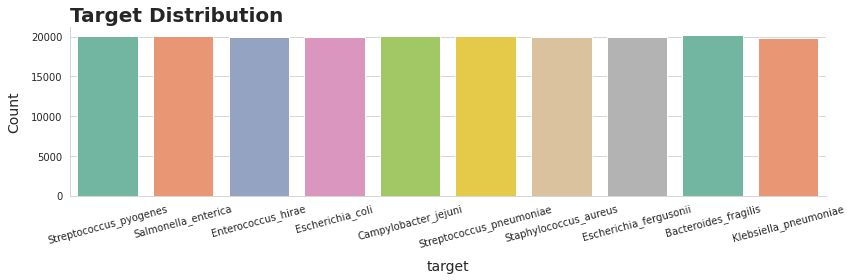

In [13]:
sns.set_style('whitegrid')
fig = plt.figure(figsize = (12, 4))
ax = fig.add_subplot(1, 1, 1)

sns.countplot(x = 'target', data = train, palette="Set2")
plt.xticks(rotation=15)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.set_xlabel("target", fontsize=14, labelpad=10)
ax.set_ylabel("Count", fontsize=14, labelpad=10)
ax.set_title('Target Distribution', loc = 'left', fontsize = 20, fontweight = 'bold')

fig.tight_layout()

## Feature Distribution

<div class = "alert alert-info" role = "alert" style="font-size:14px; font-family:verdana;">
    
📌 <b><u>Observations in Feature Distribution</u></b><br>

* Most features are skewed to the left<br>
* Some features have very low variances (unique values <= 30)
                                                            
</div>

In [14]:
numeric_columns = train.columns[train.dtypes == 'float64'].to_numpy()
len(numeric_columns)

286

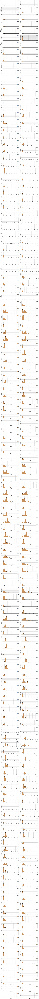

In [15]:
fig = plt.figure(figsize = (17, 1.5 * len(numeric_columns)))
rows = 143
cols = 2

for idx, numeric_column in enumerate(numeric_columns):
  ax = fig.add_subplot(rows, cols, idx + 1)
  sns.kdeplot(x = numeric_column, data = train, fill = True, alpha = 0.6, linewidth = 0.7, edgecolor = '#000', label = 'Train')
  sns.kdeplot(x = numeric_column, data = test, fill = True, alpha = 0.6, linewidth = 0.7, edgecolor = '#000', label = 'Test')

  ax.xaxis.set_tick_params(labelsize=10, size=0, pad=5)
  ax.yaxis.set_tick_params(labelsize=10, size=0, pad=5)

  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)

  if idx % cols == 0:
    ax.set_ylabel('Density')
  else:
    ax.set_ylabel('')

  ax.set_xlabel(numeric_column)
  ax.legend()

fig.tight_layout()
fig.show()

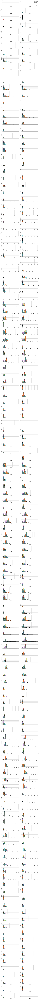

In [16]:
rows = 143
cols = 2
fig = plt.figure(figsize = (17, 1.5 * len(numeric_columns)))

for idx, numeric_column in enumerate(numeric_columns):
  ax = fig.add_subplot(rows, cols, idx + 1)
  sns.kdeplot(x = numeric_column, data = train, hue = 'target', fill = True, alpha = 0.5, linewidth = 0.7, edgecolor = '#000')
 
  ax.xaxis.set_tick_params(labelsize=10, size=0, pad=5)
  ax.yaxis.set_tick_params(labelsize=10, size=0, pad=5)

  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)

  if idx % cols == 0:
    ax.set_ylabel('Density')
  else:
    ax.set_ylabel('')

  ax.set_xlabel(numeric_column)

  if (idx + 1) != 2:
    ax.legend([])

fig.tight_layout()
fig.show()

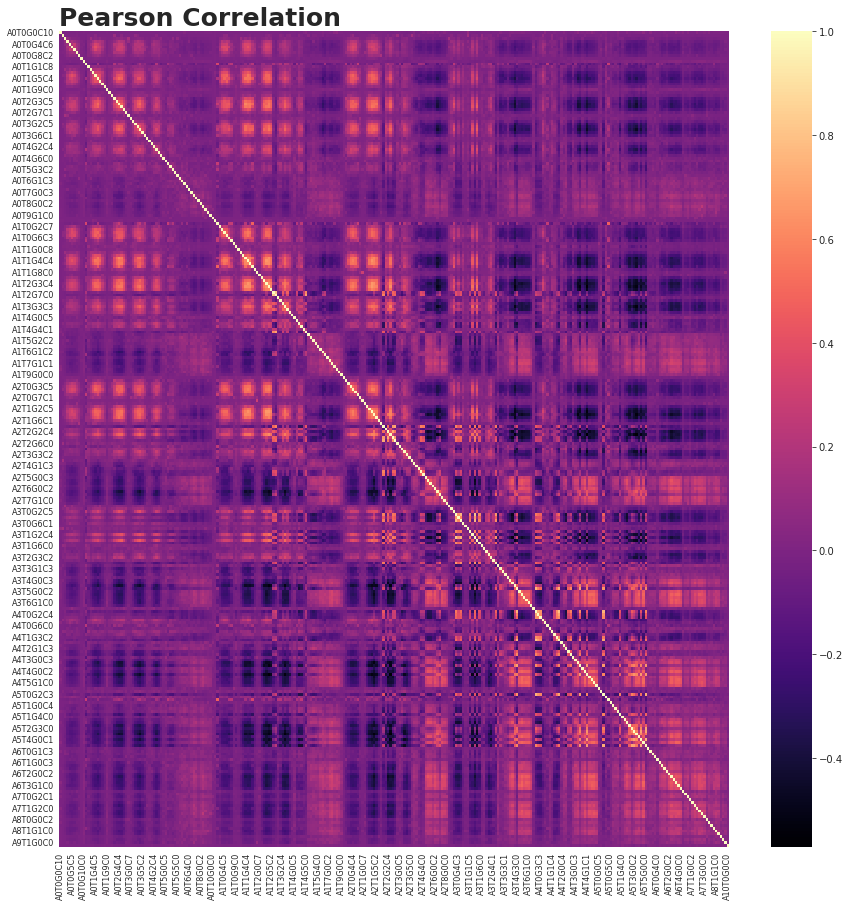

In [17]:
fig = plt.figure(figsize=(15,15))
fig.set_facecolor("#fff")
ax = fig.add_subplot()
ax.set_facecolor("#fff")

corr = train[numeric_columns].corr()
sns.heatmap(corr, annot=False, cmap='magma')
ax.xaxis.set_tick_params(labelsize=8, size=0, pad=5)
ax.yaxis.set_tick_params(labelsize=8, size=0, pad=5)
ax.set_title("Pearson Correlation", loc="left", fontsize=25, fontweight="bold")

plt.show()

In [18]:
train[numeric_columns].nunique().sort_values(ascending = False).tail(10)

A1T0G0C9     27
A0T1G9C0     26
A0T0G1C9     23
A10T0G0C0    22
A0T1G0C9     21
A0T0G9C1     21
A1T0G9C0     19
A0T10G0C0    18
A0T0G0C10    18
A0T0G10C0    14
dtype: int64

In [19]:
low_variance_columns = train[numeric_columns].nunique().sort_values(ascending = False).tail(10).index.to_numpy()

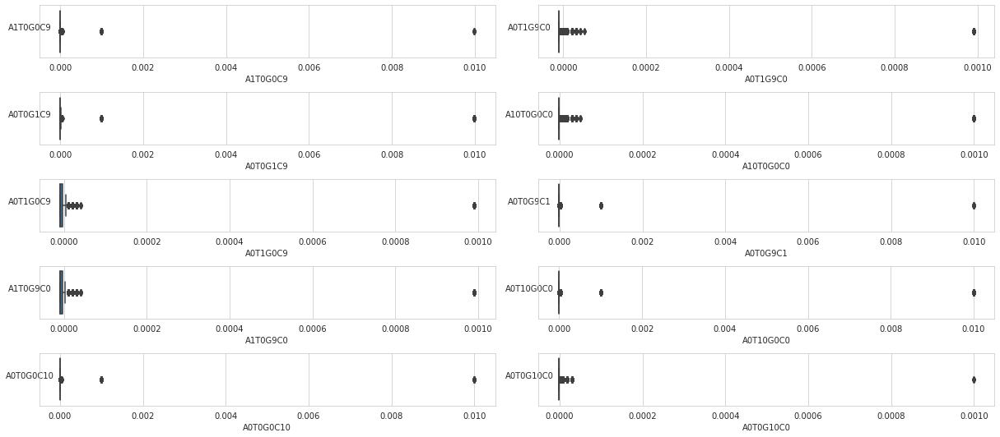

In [20]:
fig, ax = plt.subplots(5, 2, figsize = (17, 1.5 * 5))

for idx, low_variance_column in enumerate(low_variance_columns):
  ax = plt.subplot(5, 2, idx + 1)

  sns.boxplot(x = low_variance_column, data = train)

  ax.set_ylabel(low_variance_column, rotation = 0)

fig.tight_layout()
fig.show()

# Feature Engineering

## Basic Feature Engineering

In [21]:
TARGET = 'target'
FEATURES = [col for col in train.columns if col not in ['row_id', TARGET]]


train["mean"] = train[FEATURES].mean(axis=1)
train["std"] = train[FEATURES].std(axis=1)
train["min"] = train[FEATURES].min(axis=1)
train["max"] = train[FEATURES].max(axis=1)

test["mean"] = test[FEATURES].mean(axis=1)
test["std"] = test[FEATURES].std(axis=1)
test["min"] = test[FEATURES].min(axis=1)
test["max"] = test[FEATURES].max(axis=1)

FEATURES.extend(['mean', 'std', 'min', 'max'])


# Modelling

<div class = "alert alert-info" role = "alert" style="font-size:14px; font-family:verdana;">
    
📌 <b><u>Observations in Modelling</u></b><br>

* <i> <u><b>LGBMClassifier</b></u> , <u><b>CatBoostClassifier</b></u> and <u><b>XGBClassifier</b></u> used in modelling on 5-fold validation.

</div>

In [22]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
encoder = LabelEncoder()
sc = StandardScaler()

train[FEATURES] = sc.fit_transform(train[FEATURES])
test[FEATURES] = sc.transform(test[FEATURES])

train[TARGET] = encoder.fit_transform(train[TARGET])

X = train[TARGET].values
y = train[FEATURES].values

<div class = "alert alert-info" role = "alert" style="font-size:14px; font-family:verdana;">

✍️ <u><b>Train Test Split and Cross Validation</b></u><br>

Scikit-learn library provides many tools to split data into training and test sets. The most basic one is train_test_split which just divides the data into two parts according to the specified partitioning ratio.<br>

If we split data using train_test_split, we can only train a model with the portion set aside for training. The models get better as the amount of training data increases. One solution to overcome this issue is cross validation. With cross validation, dataset is divided into n splits. N-1 split is used for training and the remaining split is used for testing. The model runs through the entire dataset n times and at each time, a different split is used for testing. Thus, we use all of data points for both training and testing. Cross validation is also useful to measure the performance of a model more accurately, especially on new, previously unseen data points.<br>

There are different methods to split data in cross validation. KFold and StratifiedKFold are commonly used.<br>

As the name suggests, KFold divides the dataset into k folds.<br>

StratifiedKFold takes the cross validation one step further. The class distribution in the dataset is preserved in the training and test splits.<br>

In classifications tasks with imbalanced class distributions, we should prefer StratifiedKFold over KFold.
    
</div>

In [23]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

## XGBoost Classifier

Documentation - https://xgboost.readthedocs.io/en/stable/parameter.html#general-parameters

<i>When predictor is set to default value auto, the gpu_hist tree method is able to provide GPU based prediction without copying training data to GPU memory. If gpu_predictor is explicitly specified, then all data is copied into GPU, only recommended for performing prediction tasks.</i>



In [24]:
xgb_params = {
    'objective': 'multi:softmax', # For multiclass classification
    'eval_metric': 'mlogloss',    # Default to multiclass classification
    'tree_method': 'gpu_hist',    # Equivalent to the XGBoost fast histogram algorithm. Much faster and uses considerably less memory.
    'predictor': 'gpu_predictor', # Prediction using GPU. Used when tree_method is gpu_hist.
    'booster': 'gbtree',          # Default value
    'eta': 0.3,                   # Learning rate, default = 0.3
    'gamma': 0,                   # min_split_loss, default = 0
    'max_depth': 6,               # Maximum depth of a tree, default = 6
    'lambda': 1,                  # L2 regularization term on weights, default = 1
    'alpha': 0,                   # L1 regularization term on weights, default = 0
}

In [25]:
xgb_predictions = []
xgb_scores = []
xgb_fimp = []

cv = StratifiedKFold(n_splits = FOLDS, shuffle = True, random_state = RANDOM_STATE)
for fold, (train_idx, valid_idx) in enumerate(cv.split(train[FEATURES], train[TARGET])):
    
    print(10*"=", f"Fold = {fold + 1}", 10*"=")
    start_time = time.time()
    
    X_train, X_valid = train.iloc[train_idx][FEATURES], train.iloc[valid_idx][FEATURES]
    y_train, y_valid = train[TARGET].iloc[train_idx], train[TARGET].iloc[valid_idx]
    
    model = XGBClassifier(**xgb_params) # Use ** to pass a dictionary for parameters
    model.fit(X_train, y_train, verbose = 0)
    
    pred_valid = model.predict(X_valid)
    acc = accuracy_score(y_valid, pred_valid)
    xgb_scores.append(acc)
    run_time = time.time() - start_time
    
    print(f"Fold = {fold + 1}, Accuracy: {acc:.2f}, Run Time: {run_time:.2f}s")
    test_pred = model.predict(test[FEATURES])
    fim = pd.DataFrame(index = FEATURES,
                      data = model.feature_importances_,
                      columns = [f'{fold}_importance'])
    xgb_fimp.append(fim)
    xgb_predictions.append(test_pred)
    
print("Mean Accuracy :", np.mean(xgb_scores))

========== Fold = 1 ==========
Fold = 1, Accuracy: 0.98, Run Time: 16.32s
========== Fold = 2 ==========
Fold = 2, Accuracy: 0.98, Run Time: 14.81s
========== Fold = 3 ==========
Fold = 3, Accuracy: 0.98, Run Time: 14.71s
========== Fold = 4 ==========
Fold = 4, Accuracy: 0.98, Run Time: 14.89s
========== Fold = 5 ==========
Fold = 5, Accuracy: 0.99, Run Time: 14.94s
Mean Accuracy : 0.9847049999999999


### Feature Importance for XGBoost Classifier (Top 15 Features)

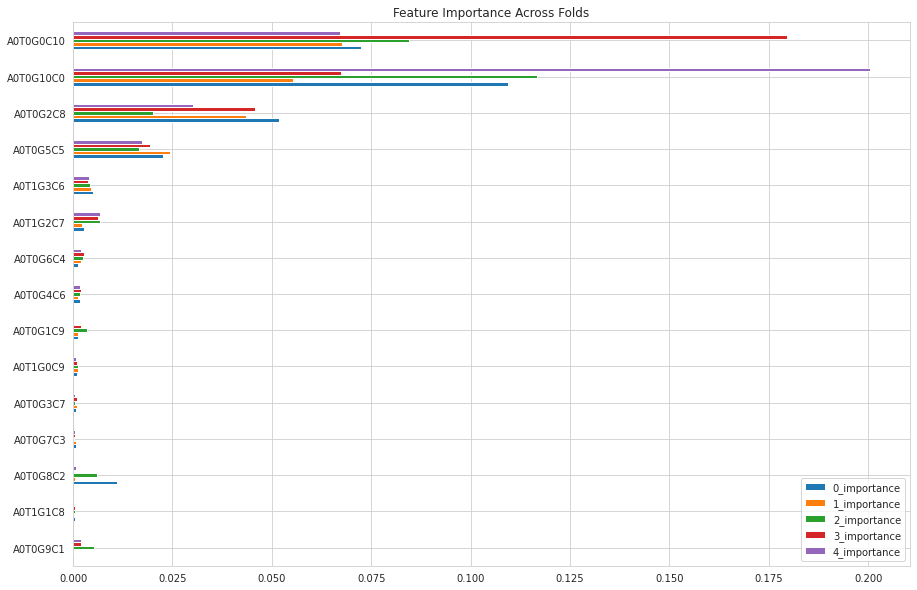

In [26]:
xgb_fis_df = pd.concat(xgb_fimp, axis = 1).head(15)
xgb_fis_df.sort_values('1_importance').plot(kind = 'barh', figsize = (15, 10), title = 'Feature Importance Across Folds')
plt.show()

## LGBM Classifier

Documentation - https://lightgbm.readthedocs.io/en/latest/Parameters.html

In [27]:
lgb_params = {
    'objective': 'multiclass',    # For multiclass classification
    'metric': 'multi_logloss',    # For multiclass classification
    'device': 'gpu',              # Use GPU
    'num_iterations': 100,        # Same as num_tree, n_iter, n_estimators. Default = 100
    'learning_rate': 0.1,         # Same as eta, default = 0.1
    'num_leaves': 31,             # Default = 31
    'max_depth': -1,              # Default = -1
    'bagging_freq': 0,            # 0 = disable bagging, default = 0
    'feature_fraction': 1,        # Randomly select n% of features on each iteration
    'lambda_l1': 0,               # Default = 0
    'lambda_l2': 0,               # Default = 0
}

In [28]:
lgb_predictions = []
lgb_scores = []
lgb_fimp = []

cv = StratifiedKFold(n_splits = FOLDS, shuffle = True, random_state = RANDOM_STATE)
for fold, (train_idx, valid_idx) in enumerate(cv.split(train[FEATURES], train[TARGET])):
    
    print(10*"=", f"Fold = {fold + 1}", 10*"=")
    start_time = time.time()
    
    X_train, X_valid = train.iloc[train_idx][FEATURES], train.iloc[valid_idx][FEATURES]
    y_train, y_valid = train[TARGET].iloc[train_idx], train[TARGET].iloc[valid_idx]
    
    model = LGBMClassifier(**lgb_params)
    model.fit(X_train, y_train, verbose = 0)
    
    pred_valid = model.predict(X_valid)
    acc = accuracy_score(y_valid, pred_valid)
    lgb_scores.append(acc)
    run_time = time.time() - start_time
    
    print(f"Fold = {fold + 1}, Accuracy: {acc:.2f}, Run Time: {run_time:.2f}s")
    test_pred = model.predict(test[FEATURES])
    fim = pd.DataFrame(index = FEATURES,
                      data = model.feature_importances_,
                      columns = [f'{fold}_importance'])
    lgb_fimp.append(fim)
    lgb_predictions.append(test_pred)
    
print("Mean Accuracy :", np.mean(lgb_scores))

========== Fold = 1 ==========
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
Fold = 1, Accuracy: 0.98, Run Time: 62.67s
========== Fold = 2 ==========
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
Fold = 2, Accuracy: 0.98, Run Time: 58.77

### Feature Importance for LGBM Classifier (Top 15 Features)

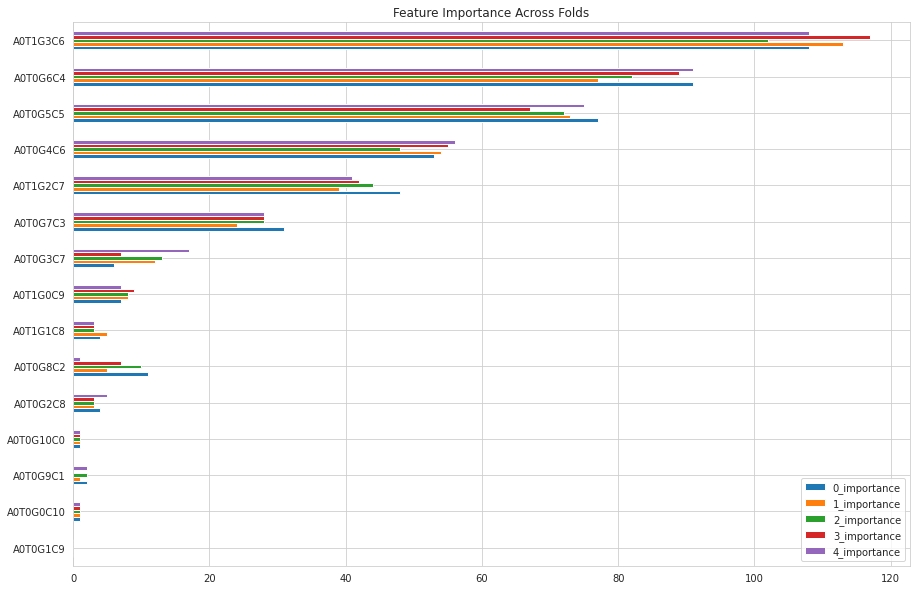

In [29]:
lgbm_fis_df = pd.concat(lgb_fimp, axis = 1).head(15)
lgbm_fis_df.sort_values('1_importance').plot(kind = 'barh', figsize = (15, 10), title = 'Feature Importance Across Folds')
plt.show()

## Catboost Classifier

Documentation - https://catboost.ai/en/docs/references/training-parameters/

In [30]:
catb_params = {
    'objective': "MultiClass",       # For multiclass classification
    "task_type": "GPU",              # Use GPU
}

In [31]:
catb_predictions = []
catb_scores = []
catb_fimp = []

cv = StratifiedKFold(n_splits = FOLDS, shuffle = True, random_state = RANDOM_STATE)
for fold, (train_idx, valid_idx) in enumerate(cv.split(train[FEATURES], train[TARGET])):
    
    print(10*"=", f"Fold = {fold + 1}", 10*"=")
    start_time = time.time()
    
    X_train, X_valid = train.iloc[train_idx][FEATURES], train.iloc[valid_idx][FEATURES]
    y_train, y_valid = train[TARGET].iloc[train_idx], train[TARGET].iloc[valid_idx]
    
    model = CatBoostClassifier(**catb_params)
    model.fit(X_train, y_train, verbose = 0)
    
    pred_valid = model.predict(X_valid)
    acc = accuracy_score(y_valid, pred_valid)
    catb_scores.append(acc)
    run_time = time.time() - start_time
    
    print(f"Fold = {fold + 1}, Accuracy: {acc:.2f}, Run Time: {run_time:.2f}s")
    test_pred = model.predict(test[FEATURES])
    fim = pd.DataFrame(index = FEATURES,
                      data = model.feature_importances_,
                      columns = [f'{fold}_importance'])
    catb_fimp.append(fim)
    catb_predictions.append(test_pred)
    
print("Mean Accuracy :", np.mean(catb_scores))

========== Fold = 1 ==========
Fold = 1, Accuracy: 0.99, Run Time: 98.20s
========== Fold = 2 ==========
Fold = 2, Accuracy: 0.99, Run Time: 25.67s
========== Fold = 3 ==========
Fold = 3, Accuracy: 0.99, Run Time: 24.85s
========== Fold = 4 ==========
Fold = 4, Accuracy: 0.99, Run Time: 25.60s
========== Fold = 5 ==========
Fold = 5, Accuracy: 0.99, Run Time: 25.60s
Mean Accuracy : 0.9863


### Feature Importance for LGBM Classifier (Top 15 Features)

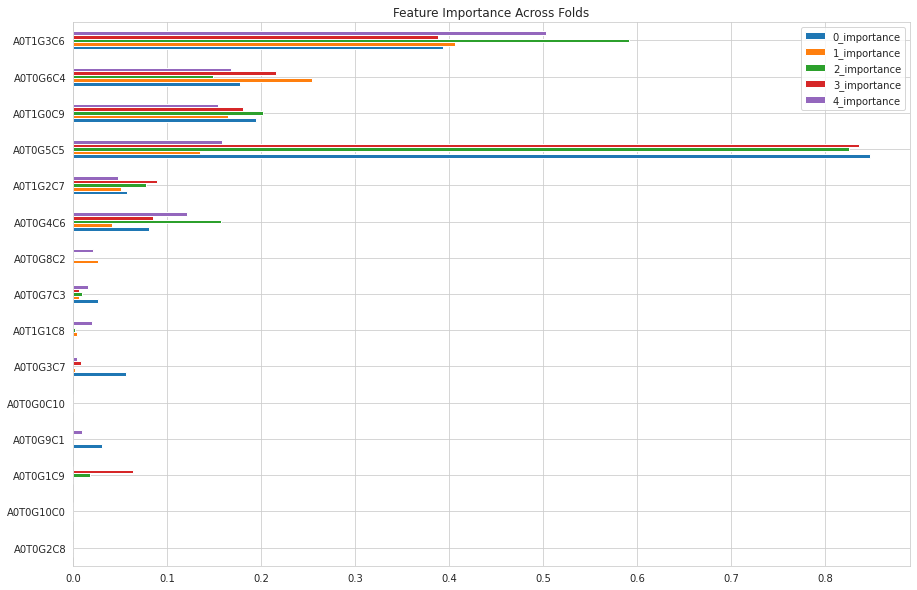

In [32]:
catb_fis_df = pd.concat(catb_fimp, axis = 1).head(15)
catb_fis_df.sort_values('1_importance').plot(kind = 'barh', figsize = (15, 10), title = 'Feature Importance Across Folds')
plt.show()

## Extra Tree Classifier

In [33]:
etc_predictions = []
etc_scores = []
etc_fimp = []

cv = StratifiedKFold(n_splits = FOLDS, shuffle = True, random_state = RANDOM_STATE)
for fold, (train_idx, valid_idx) in enumerate(cv.split(train[FEATURES], train[TARGET])):
    
    print(10*"=", f"Fold = {fold + 1}", 10*"=")
    start_time = time.time()
    
    X_train, X_valid = train.iloc[train_idx][FEATURES], train.iloc[valid_idx][FEATURES]
    y_train, y_valid = train[TARGET].iloc[train_idx], train[TARGET].iloc[valid_idx]
    
    model = ExtraTreesClassifier(n_estimators = 500, n_jobs = -1, verbose = 0)
    model.fit(X_train, y_train)
    
    pred_valid = model.predict(X_valid)
    acc = accuracy_score(y_valid, pred_valid)
    etc_scores.append(acc)
    run_time = time.time() - start_time
    
    print(f"Fold = {fold + 1}, Accuracy: {acc:.2f}, Run Time: {run_time:.2f}s")
    test_pred = model.predict(test[FEATURES])
    fim = pd.DataFrame(index = FEATURES,
                      data = model.feature_importances_,
                      columns = [f'{fold}_importance'])
    etc_fimp.append(fim)
    etc_predictions.append(test_pred)
    
print("Mean Accuracy :", np.mean(etc_scores))

========== Fold = 1 ==========
Fold = 1, Accuracy: 1.00, Run Time: 250.86s
========== Fold = 2 ==========
Fold = 2, Accuracy: 0.99, Run Time: 269.53s
========== Fold = 3 ==========
Fold = 3, Accuracy: 1.00, Run Time: 269.80s
========== Fold = 4 ==========
Fold = 4, Accuracy: 1.00, Run Time: 269.91s
========== Fold = 5 ==========
Fold = 5, Accuracy: 1.00, Run Time: 264.80s
Mean Accuracy : 0.9951450000000002


### Feature Importance for Extra Tree Classifier (Top 15 Features)

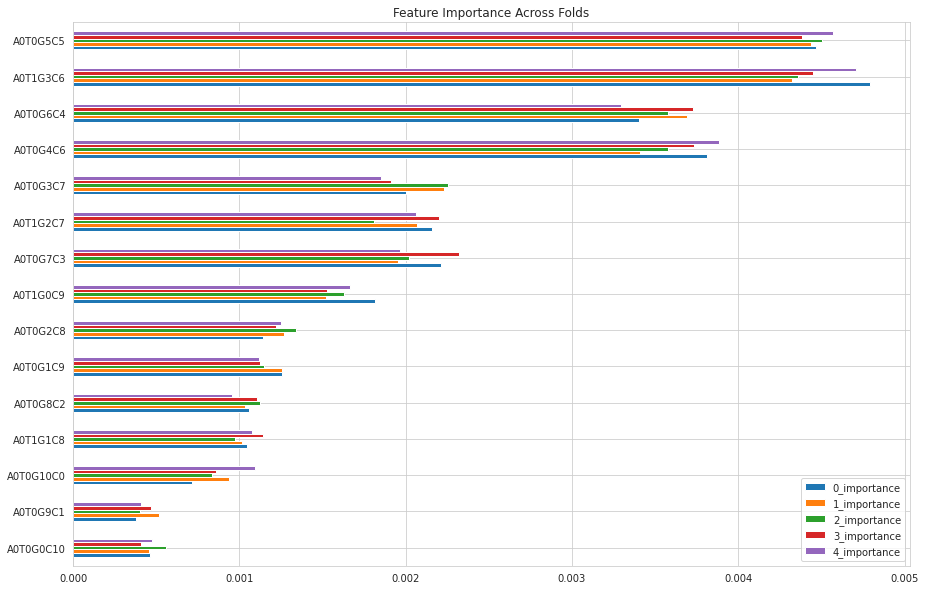

In [34]:
etc_fis_df = pd.concat(etc_fimp, axis = 1).head(15)
etc_fis_df.sort_values('1_importance').plot(kind = 'barh', figsize = (15, 10), title = 'Feature Importance Across Folds')
plt.show()

# Ensemble Model

In [35]:
vote_predictions = []
vote_scores = []

cv = StratifiedKFold(n_splits = FOLDS, shuffle = True, random_state = RANDOM_STATE)
for fold, (train_idx, valid_idx) in enumerate(cv.split(train[FEATURES], train[TARGET])):
    
    print(10*"=", f"Fold = {fold + 1}", 10*"=")
    start_time = time.time()
    
    X_train, X_valid = train.iloc[train_idx][FEATURES], train.iloc[valid_idx][FEATURES]
    y_train, y_valid = train[TARGET].iloc[train_idx], train[TARGET].iloc[valid_idx]
    
    model = VotingClassifier(
            estimators = [
                ('XGB_model', XGBClassifier(**xgb_params)),
                ('LGBM_model', LGBMClassifier(**lgb_params)),
                ('CatBoost_model', CatBoostClassifier(**catb_params)),
                ('ETC_model', ExtraTreesClassifier(n_estimators = 500, n_jobs = -1))],
            voting = 'soft'
            )
    
    model.fit(X_train, y_train)
    
    pred_valid = model.predict(X_valid)
    acc = accuracy_score(y_valid, pred_valid)
    vote_scores.append(acc)
    run_time = time.time() - start_time
    
    print(f"Fold = {fold + 1}, Accuracy: {acc:.2f}, Run Time: {run_time:.2f}s")
    test_pred = model.predict(test[FEATURES])

    vote_predictions.append(test_pred)
    
print("Mean Accuracy :", np.mean(vote_scores))

========== Fold = 1 ==========
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] feature_fraction is set=1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
Learning rate set to 0.182778
0:	learn: 1.8063176	total: 34.8ms	remaining: 34.7s
1:	learn: 1.5969979	total: 62.8ms	remaining: 31.3s
2:	learn: 1.4538823	total: 99.2ms	remaining: 33s
3:	learn: 1.3515005	total: 126ms	remaining: 31.5s
4:	learn: 1.2691979	total: 159ms	remaining: 31.7s
5:	learn: 1.2045013	total: 185ms	remaining: 30.6s
6:	learn: 1.1425664	total: 212ms	remaining: 30.1s
7:	learn: 1.0875417	total: 239ms	remaining: 29.6s
8:	learn: 1.0463705	total: 268ms	remaining: 29.5s
9:	learn: 1.0089445	total: 311ms	remaining: 30.8s
10:	learn: 

In [36]:
submission = submission[['row_id']]

In [37]:
xgb_submission = submission.copy()
xgb_submission["target"] = encoder.inverse_transform(np.squeeze(mode(np.column_stack(xgb_predictions),axis = 1)[0]).astype('int'))
xgb_submission.to_csv("xgb-subs.csv",index=False)
xgb_submission.head()

,row_id,target
0,200000,Escherichia_fergusonii
1,200001,Salmonella_enterica
2,200002,Enterococcus_hirae
3,200003,Salmonella_enterica
4,200004,Staphylococcus_aureus


In [38]:
lgb_submission = submission.copy()
lgb_submission["target"] = encoder.inverse_transform(np.squeeze(mode(np.column_stack(lgb_predictions),axis = 1)[0]).astype('int'))
lgb_submission.to_csv("lgb-subs.csv",index=False)
lgb_submission.head()

,row_id,target
0,200000,Escherichia_fergusonii
1,200001,Salmonella_enterica
2,200002,Enterococcus_hirae
3,200003,Salmonella_enterica
4,200004,Staphylococcus_aureus


In [39]:
catb_submission = submission.copy()
catb_submission["target"] = encoder.inverse_transform(np.squeeze(mode(np.column_stack(catb_predictions),axis = 1)[0]).astype('int'))
catb_submission.to_csv("catb.csv",index=False)
catb_submission.head()

,row_id,target
0,200000,Escherichia_fergusonii
1,200001,Salmonella_enterica
2,200002,Enterococcus_hirae
3,200003,Salmonella_enterica
4,200004,Staphylococcus_aureus


In [40]:
etc_submission = submission.copy()
etc_submission["target"] = encoder.inverse_transform(np.squeeze(mode(np.column_stack(etc_predictions),axis = 1)[0]).astype('int'))
etc_submission.to_csv("etc.csv",index=False)
etc_submission.head()

,row_id,target
0,200000,Escherichia_fergusonii
1,200001,Salmonella_enterica
2,200002,Enterococcus_hirae
3,200003,Salmonella_enterica
4,200004,Staphylococcus_aureus


In [41]:
mode_submission = submission.copy()
pred_mode = encoder.inverse_transform(np.squeeze(mode(np.column_stack(xgb_predictions + lgb_predictions + catb_predictions + etc_predictions),axis = 1)[0]).astype('int'))
mode_submission["target"] = pred_mode
mode_submission.to_csv("pred_mode.csv",index=False)
mode_submission.head()

,row_id,target
0,200000,Escherichia_fergusonii
1,200001,Salmonella_enterica
2,200002,Enterococcus_hirae
3,200003,Salmonella_enterica
4,200004,Staphylococcus_aureus


In [42]:
vote_submission = submission.copy()
vote_pred = encoder.inverse_transform(np.squeeze(mode(np.column_stack(vote_predictions),axis = 1)[0]).astype('int'))
vote_submission["target"] = vote_pred
vote_submission.to_csv("pred_vote.csv",index=False)
vote_submission.head()

,row_id,target
0,200000,Escherichia_fergusonii
1,200001,Salmonella_enterica
2,200002,Enterococcus_hirae
3,200003,Salmonella_enterica
4,200004,Staphylococcus_aureus
